In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load in 

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the "../input/" directory.
# For example, running this (by clicking run or pressing Shift+Enter) will list the files in the input directory

import os
print(os.listdir("../input"))

# Any results you write to the current directory are saved as output.

['test', 'train.csv', 'sample_submission.csv']


In [2]:
import time
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats
import warnings
sns.set()
warnings.simplefilter(action='ignore', category=FutureWarning)
warnings.simplefilter(action='ignore', category=RuntimeWarning)


## 1. Overview
As stated in the description, the data for this competition comes from a experimental set-up used to study earthquake physics. Our goal is to predict the time remaining before the next laboratory earthquake. The only feature we have is the seismic signal (acoustic data) which has integer values in a limited range.

Training data: single, continuous segment of experimental data.

Test data: consists of a folder containing many small segments. The data within each test file is continuous, but the test files do not represent a continuous segment of the experiment.

There are a lot of files in this competition, so let's start with the folders structure:

In [3]:
print(os.listdir("../input/"))

['test', 'train.csv', 'sample_submission.csv']


The test folder has 2624 csv files (segments):

In [4]:
test_folder_files = os.listdir("../input/test")
print(test_folder_files[:10])  # print first 10
print("\nNumber of files in the test folder", len(test_folder_files))

['seg_0b082e.csv', 'seg_9e7dff.csv', 'seg_b6c10d.csv', 'seg_4435bd.csv', 'seg_c09a41.csv', 'seg_31ddc5.csv', 'seg_71238c.csv', 'seg_6a05e7.csv', 'seg_d47aba.csv', 'seg_eea20e.csv']

Number of files in the test folder 2624


Each segment contains 150,000 acoustic records:

In [5]:
test_file = pd.read_csv('../input/test/seg_0b082e.csv')
print("Segment shape", test_file.shape)
test_file.head()

Segment shape (150000, 1)


,acoustic_data
0,3
1,10
2,4
3,4
4,1


There is one file in the test folder for each prediction (seg_id) in sample_submission:

In [6]:
sample_sub = pd.read_csv('../input/sample_submission.csv')
print("Submission shape", sample_sub.shape)
sample_sub.head()

Submission shape (2624, 2)


,seg_id,time_to_failure
0,seg_00030f,0
1,seg_0012b5,0
2,seg_00184e,0
3,seg_003339,0
4,seg_0042cc,0


## 2. Training data
One huge csv file has all the training data, which is a single continuous experiment. There are only two columns in this file:

Acoustic data (int16): the seismic signal
Time to failure (float64): the time until the next laboratory earthquake (in seconds)
No missing values for both columns

In [7]:
%%time
train = pd.read_csv('../input/train.csv', dtype={'acoustic_data': np.int16, 'time_to_failure': np.float32})

CPU times: user 2min 22s, sys: 15.3 s, total: 2min 37s
Wall time: 2min 38s


In [8]:
pd.set_option("display.precision", 15)  # show more decimals
train.head()

,acoustic_data,time_to_failure
0,12,1.469099998474121
1,6,1.469099998474121
2,8,1.469099998474121
3,5,1.469099998474121
4,8,1.469099998474121


In [9]:
print('The training data has {} rows and {} columns'.format(train.shape[0],train.shape[1]))


The training data has 629145480 rows and 2 columns


### Acoustic data
Our single feature are integers in the range [-5515, 5444] with mean 4.52

In [10]:
pd.set_option("display.precision", 8)
train.acoustic_data.describe()

count    6.29145480e+08
mean     4.51946757e+00
std      1.07357072e+01
min     -5.51500000e+03
25%      2.00000000e+00
50%      5.00000000e+00
75%      7.00000000e+00
max      5.44400000e+03
Name: acoustic_data, dtype: float64

The plot below is using a 1% random sample (~6M rows):

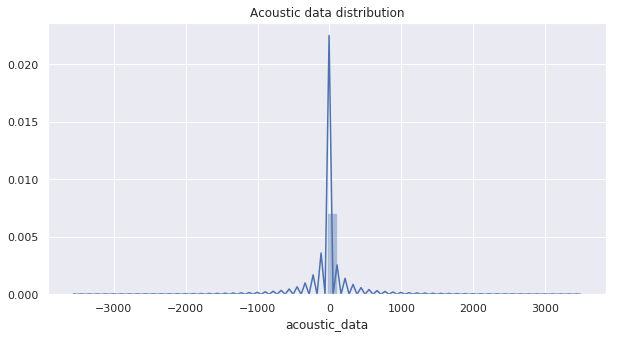

In [11]:
train_sample = train.sample(frac=0.01)
plt.figure(figsize=(10,5))
plt.title("Acoustic data distribution")
ax = sns.distplot(train_sample.acoustic_data, label='Train (1% sample)')
del train_sample

There are outliers in both directions; let's try to plot the same distribution with x in the range -20 to 30. The black line is the closest normal distribution (gaussian) possible.

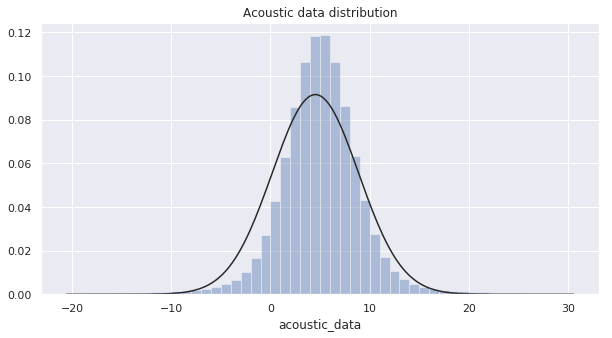

In [12]:
train_sample = train.sample(frac=0.01)
plt.figure(figsize=(10,5))
plt.title("Acoustic data distribution")
tmp = train_sample[train_sample.acoustic_data.between(-20, 30)]
ax = sns.distplot(tmp.acoustic_data, label='Train (1% sample)', kde=False, fit=stats.norm)
#del train_sample

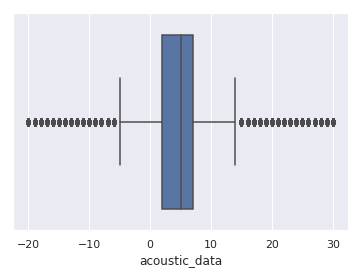

In [13]:
import seaborn as sns
sns.boxplot(x = tmp.acoustic_data)

## Time to failure
Now let's check the target variable, which is given in seconds:

In [14]:
train.time_to_failure.describe()

count    6.29145480e+08
mean     4.47708428e-01
std      2.61278939e+00
min      9.55039650e-05
25%      2.62599707e+00
50%      5.34979773e+00
75%      8.17339516e+00
max      1.61074009e+01
Name: time_to_failure, dtype: float64

The min value is very close to zero (around 10^-5) and the max is 16 seconds. Now the distribution for the random sample:

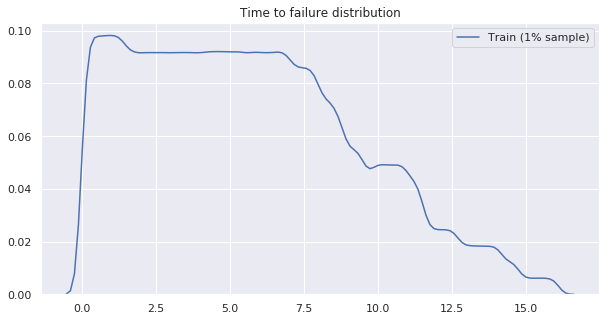

In [15]:
plt.figure(figsize=(10,5))
plt.title("Time to failure distribution")
ax = sns.kdeplot(train_sample.time_to_failure, label='Train (1% sample)')

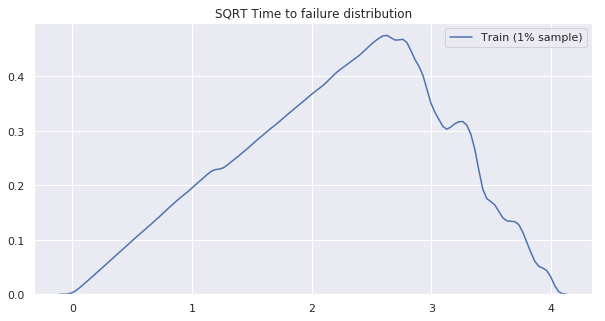

In [16]:
train_sample = train.sample(frac=0.01)
sqrt_time = np.sqrt(train_sample.time_to_failure)
plt.figure(figsize=(10,5))
plt.title("SQRT Time to failure distribution")
ax = sns.kdeplot(sqrt_time, label='Train (1% sample)')

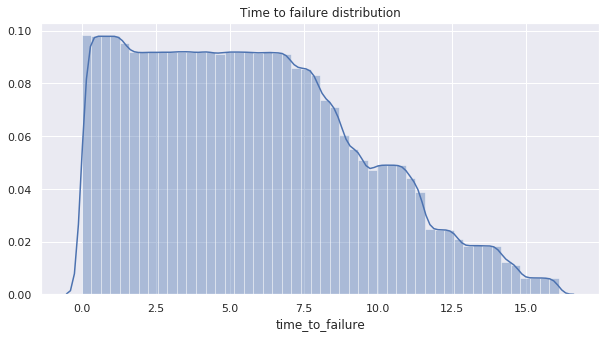

In [17]:
train_sample = train.sample(frac=0.01)
plt.figure(figsize=(10,5))
plt.title("Time to failure distribution")
ax = sns.distplot(train_sample.time_to_failure, label='Train (1% sample)')
del train_sample

## Timeseries
Let's see how both variables change over time. The red line is the acoustic data and the blue one is the time to failure:

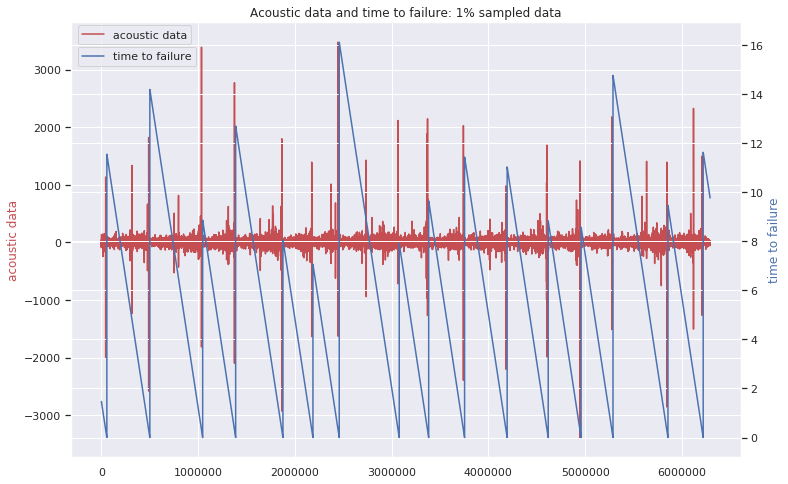

In [18]:
train_ad_sample_df = train['acoustic_data'].values[::100]
train_ttf_sample_df = train['time_to_failure'].values[::100]

def plot_acc_ttf_data(train_ad_sample_df, train_ttf_sample_df, title="Acoustic data and time to failure: 1% sampled data"):
    fig, ax1 = plt.subplots(figsize=(12, 8))
    plt.title(title)
    plt.plot(train_ad_sample_df, color='r')
    ax1.set_ylabel('acoustic data', color='r')
    plt.legend(['acoustic data'], loc=(0.01, 0.95))
    ax2 = ax1.twinx()
    plt.plot(train_ttf_sample_df, color='b')
    ax2.set_ylabel('time to failure', color='b')
    plt.legend(['time to failure'], loc=(0.01, 0.9))
    plt.grid(True)

plot_acc_ttf_data(train_ad_sample_df, train_ttf_sample_df)


On a plot above we can see, that training data has 16 earthquakes. The shortest time to failure is 1.5 seconds for the first earthquake and 7seconds for the 7th, while the longest is around 16 seconds.
* We can see that usually acoustic data shows huge fluctuations just before the failure and the nature of data is cyclical;
* Another important point: visually failures can be predicted as cases when huge fluctuations in signal are followes by small signal values. This could be useful for predicting "time_to_failure" changes from 0 to high values;

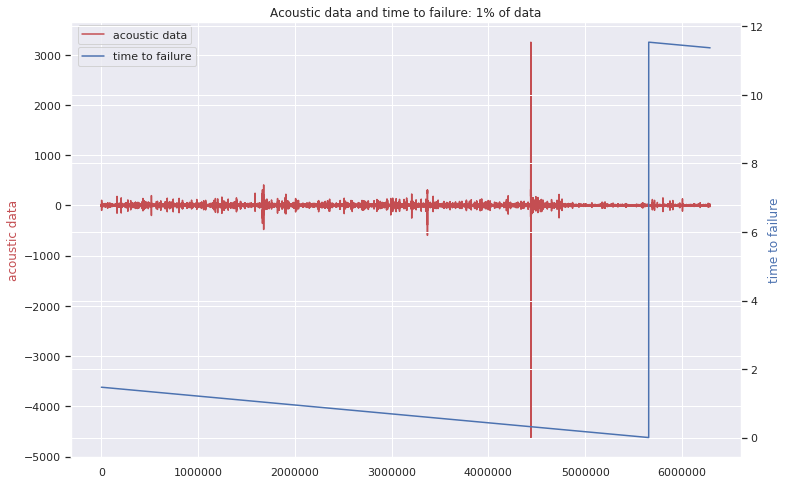

In [19]:
train_ad_sample_df_2 = train['acoustic_data'].values[:6291455]
train_ttf_sample_df_2 = train['time_to_failure'].values[:6291455]
plot_acc_ttf_data(train_ad_sample_df_2, train_ttf_sample_df_2, title="Acoustic data and time to failure: 1% of data")
del train_ad_sample_df_2
del train_ttf_sample_df_2

On this zoomed-in-time plot we can see that actually the large oscilation before the failure is not quite in the last moment. There are also trains of intense oscilations preceeding the large one and also some oscilations with smaller peaks after the large one. Then, after some minor oscilations, the failure occurs.
Interesting thing to check is the time between high levels of seismic signal and the earthquakes. We are considering any acoustic data with absolute value greater than 1000 as a high level:

In [20]:
peaks = train[train.acoustic_data.abs() > 1000]
peaks.time_to_failure.describe()

count    11325.00000000
mean         0.64454830
std          1.32147193
min          0.31079626
25%          0.31549615
50%          0.31689683
75%          0.32029617
max          8.86059952
Name: time_to_failure, dtype: float64

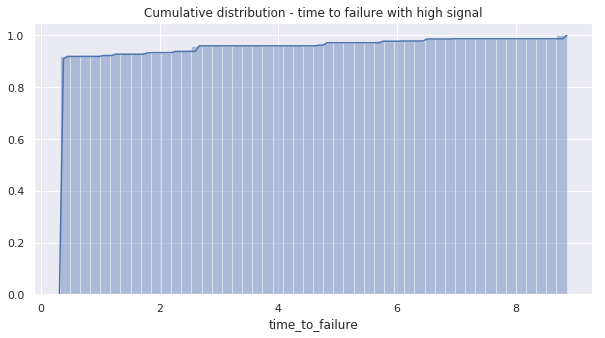

In [21]:
plt.figure(figsize=(10,5))
plt.title("Cumulative distribution - time to failure with high signal")
ax = sns.distplot(peaks.time_to_failure, hist_kws=dict(cumulative=True), kde_kws=dict(cumulative=True))
del peaks

**More than 90% of high acoustic values are around 0.31 seconds before an earthquake!**

array([1.4691   , 1.4690999, 1.4690998, ..., 9.759796 , 9.759796 ,
       9.759795 ], dtype=float32)

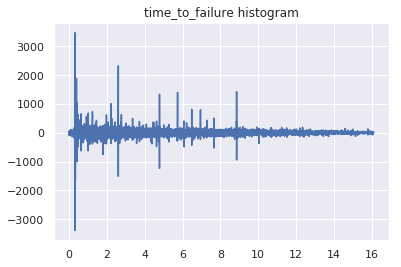

In [22]:
plt.plot(train_ttf_sample_df, train_ad_sample_df)
plt.title("time_to_failure histogram")
train_ad_sample_df
train_ttf_sample_df

Lets see the same plot as above, but without acustic outliers.

Text(0.5, 1.0, 'time_to_failure histogram')

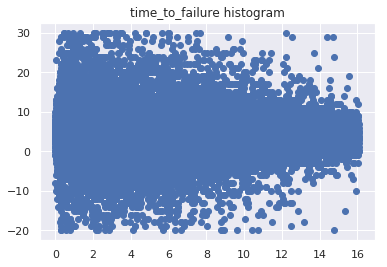

In [23]:
train_ad_sample_df = tmp['acoustic_data'].values[::100]
train_ttf_sample_df = tmp['time_to_failure'].values[::100]
plt.scatter(train_ttf_sample_df, train_ad_sample_df)
plt.title("time_to_failure histogram")

In [24]:
import gc
a = gc.collect()
del a

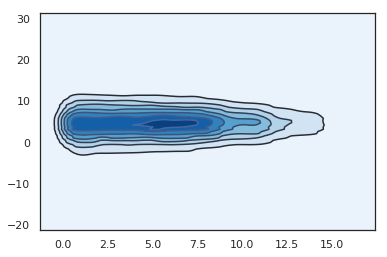

In [25]:
# library & dataset
import seaborn as sns
import matplotlib.pyplot as plt
 
# Basic 2D density plot
sns.set_style("white")
sns.kdeplot(train_ttf_sample_df, train_ad_sample_df)
#sns.plt.show()
 
# Custom it with the same argument as 1D density plot
sns.kdeplot(train_ttf_sample_df, train_ad_sample_df, cmap="Reds", shade=True, bw=.15)
 
# Some features are characteristic of 2D: color palette and wether or not color the lowest range
sns.kdeplot(train_ttf_sample_df, train_ad_sample_df, cmap="Blues", shade=True, shade_lowest=True, )
plt.show()


## Part I: We will divide the train data set for segments

Group the training data in chunks of 150,000 examples and extract the following features:


In [26]:
#The Amplitude Spectral Density ASDs are the square root of the power spectral densities (PSDs), 
#which are averages of the square of the fast fourier transforms (FFTs) of the data.

from scipy.fftpack import fft, rfft
import math
from tqdm import tqdm
from scipy.stats import moment
#rows = 150_000
rows = 1_500_000
segments = int(np.floor(train.shape[0] / rows))

X_train = pd.DataFrame(index=range(segments), dtype=np.float64)
y_train = pd.DataFrame(index=range(segments), dtype=np.float64)

for segment in tqdm(range(segments)):
    seg = train.iloc[segment*rows:segment*rows+rows]
    #seg = seg[seg.acoustic_data.between(0,5000)]
    x = seg['acoustic_data']   # pd series
    y = seg['time_to_failure'].values[-1]  # single value
    
    #y_train.loc[segment, 'time_to_failure'] = np.log(y)
    y_train.loc[segment, 'time_to_failure'] = np.sqrt(y)
    
    I_ave10 = 0.1*len(x)
    II_ave10 = 0.2*len(x)
    III_ave10 = 0.3*len(x)
    IV_ave10 = 0.4*len(x)
    V_ave10 = 0.5*len(x)
    VI_ave10 = 0.6*len(x)
    VII_ave10 = 0.7*len(x)
    VIII_ave10 = 0.8*len(x)
    IX_ave10 = 0.9*len(x)
    
            
    #X_train.loc[segment, 'rFFT mean'] = rfft(x).mean()
    #X_train.loc[segment, 'rFFT std'] = rfft(x).std()
       
    #X_train.loc[segment, '0<x<5'] = sum(x.between(0, 5))
    #X_train.loc[segment, '5<x<10'] = sum(x.between(5, 10))    
    #X_train.loc[segment, '10<x<20'] = sum(x.between(10, 20))
    #X_train.loc[segment, '20<x<30'] = sum(x.between(20, 30))
    #X_train.loc[segment, '30<x<100'] = sum(x.between(30, 100))
    #X_train.loc[segment, '100<x<500'] = sum(x.between(100, 500))
    #X_train.loc[segment, '500<x<1000'] = sum(x.between(500, 1000))
    #X_train.loc[segment, '1000<x<5000'] = sum(x.between(1000, 5000))
    
    #X_train.loc[segment, 'skewness'] = moment(x, moment=3)
    #X_train.loc[segment, 'kurtosis'] = moment(x, moment=4)
    #X_train.loc[segment, 'hyperskewness m5'] = moment(x, moment=5)
    #X_train.loc[segment, 'hyperskewness m6'] = moment(x, moment=6)
    #X_train.loc[segment, 'hyperskewness m7'] = moment(x, moment=7)
    #X_train.loc[segment, 'hyperskewness m8'] = moment(x, moment=8)
    #X_train.loc[segment, 'hyperskewness m9'] = moment(x, moment=9)
    #X_train.loc[segment, 'hyperskewness m10'] = moment(x, moment=10)
    #X_train.loc[segment, 'ave'] = x.values.mean()
    X_train.loc[segment, 'std'] = x.values.std()
    #X_train.loc[segment, 'max'] = x.values.max()
    #X_train.loc[segment, 'min'] = x.values.min()
        
    X_train.loc[segment, 'q90'] = np.quantile(x.values, 0.90)
    #X_train.loc[segment, 'q91'] = np.quantile(x.values, 0.91)
    #X_train.loc[segment, 'q92'] = np.quantile(x.values, 0.92)
    #X_train.loc[segment, 'q93'] = np.quantile(x.values, 0.93)
    #X_train.loc[segment, 'q94'] = np.quantile(x.values, 0.94)
    X_train.loc[segment, 'q95'] = np.quantile(x.values, 0.95)
    #X_train.loc[segment, 'q96'] = np.quantile(x.values, 0.96)
    #X_train.loc[segment, 'q97'] = np.quantile(x.values, 0.97)
    #X_train.loc[segment, 'q98'] = np.quantile(x.values, 0.98)
    X_train.loc[segment, 'q99'] = np.quantile(x.values, 0.99)
    #X_train.loc[segment, 'q01'] = np.quantile(x.values, 0.01)
    #X_train.loc[segment, 'q02'] = np.quantile(x.values, 0.02)
    #X_train.loc[segment, 'q03'] = np.quantile(x.values, 0.03)
    #X_train.loc[segment, 'q04'] = np.quantile(x.values, 0.04)
    ##X_train.loc[segment, 'q05'] = np.quantile(x.values, 0.05)
    #X_train.loc[segment, 'q06'] = np.quantile(x.values, 0.06)
    #X_train.loc[segment, 'q07'] = np.quantile(x.values, 0.07)
    #X_train.loc[segment, 'q08'] = np.quantile(x.values, 0.08)
    #X_train.loc[segment, 'q09'] = np.quantile(x.values, 0.09)
    #X_train.loc[segment, 'q50'] = np.quantile(x.values, 0.5)
    
    #X_train.loc[segment, 'abs_max'] = np.abs(x.values).max()
    #X_train.loc[segment, 'abs_mean'] = np.abs(x.values).mean()
    X_train.loc[segment, 'abs_std'] = np.abs(x.values).std()
        
     # New features - rolling features
    for w in [100, 1000, 10000]:
        x_roll_std = x.rolling(w).std().dropna().values
        x_roll_mean = x.rolling(w).mean().dropna().values
        x_roll_abs_mean = x.abs().rolling(w).mean().dropna().values
        
        X_train.loc[segment, 'ave_roll_std_' + str(w)] = x_roll_std.mean()
        X_train.loc[segment, 'std_roll_std_' + str(w)] = x_roll_std.std()
        #X_train.loc[segment, 'max_roll_std_' + str(w)] = x_roll_std.max()
        X_train.loc[segment, 'min_roll_std_' + str(w)] = x_roll_std.min()
        #X_train.loc[segment, 'mean_rFFT_roll_std_' + str(w)] = rfft(x_roll_std).mean()
        #X_train.loc[segment, 'std_rFFT_roll_std_' + str(w)] = rfft(x_roll_std).std()
                        
        #X_train.loc[segment, 'ave_roll_mean_' + str(w)] = x_roll_mean.mean()
        #X_train.loc[segment, 'std_roll_mean_' + str(w)] = x_roll_mean.std()
        #X_train.loc[segment, 'max_roll_mean_' + str(w)] = x_roll_mean.max()
        #X_train.loc[segment, 'min_roll_mean_' + str(w)] = x_roll_mean.min()
        #X_train.loc[segment, 'mean_rFFT_roll_mean_' + str(w)] = rfft(x_roll_mean).mean()
        #X_train.loc[segment, 'std_rFFT_roll_mean_' + str(w)] = rfft(x_roll_mean).std()
               
              
        X_train.loc[segment, 'q01_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.01)
        X_train.loc[segment, 'q05_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.05)
        X_train.loc[segment, 'q10_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.10)
        X_train.loc[segment, 'q90_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.90)
        X_train.loc[segment, 'q95_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.95)
        X_train.loc[segment, 'q99_roll_std_' + str(w)] = np.quantile(x_roll_std, 0.99)
        #X_train.loc[segment, 'q01_roll_mean_' + str(w)] = np.quantile(x_roll_mean, 0.01)
        #X_train.loc[segment, 'q05_roll_mean_' + str(w)] = np.quantile(x_roll_mean, 0.05)
        #X_train.loc[segment, 'q95_roll_mean_' + str(w)] = np.quantile(x_roll_mean, 0.95)
        #X_train.loc[segment, 'q99_roll_mean_' + str(w)] = np.quantile(x_roll_mean, 0.99)
        #X_train.loc[segment, 'ave_roll_abs_mean_' + str(w)] = x_roll_abs_mean.mean()
        X_train.loc[segment, 'std_roll_abs_mean_' + str(w)] = x_roll_abs_mean.std()
        #X_train.loc[segment, 'max_roll_abs_mean_' + str(w)] = x_roll_abs_mean.max()
        #X_train.loc[segment, 'min_roll_abs_mean_' + str(w)] = x_roll_abs_mean.min()
        #X_train.loc[segment, 'q01_roll_abs_mean_' + str(w)] = np.quantile(x_roll_abs_mean, 0.01)
        #X_train.loc[segment, 'q05_roll_abs_mean_' + str(w)] = np.quantile(x_roll_abs_mean, 0.05)
        #X_train.loc[segment, 'q95_roll_abs_mean_' + str(w)] = np.quantile(x_roll_abs_mean, 0.95)
        #X_train.loc[segment, 'q99_roll_abs_mean_' + str(w)] = np.quantile(x_roll_abs_mean, 0.99)
          
       

100%|██████████| 419/419 [06:46<00:00,  1.00it/s]


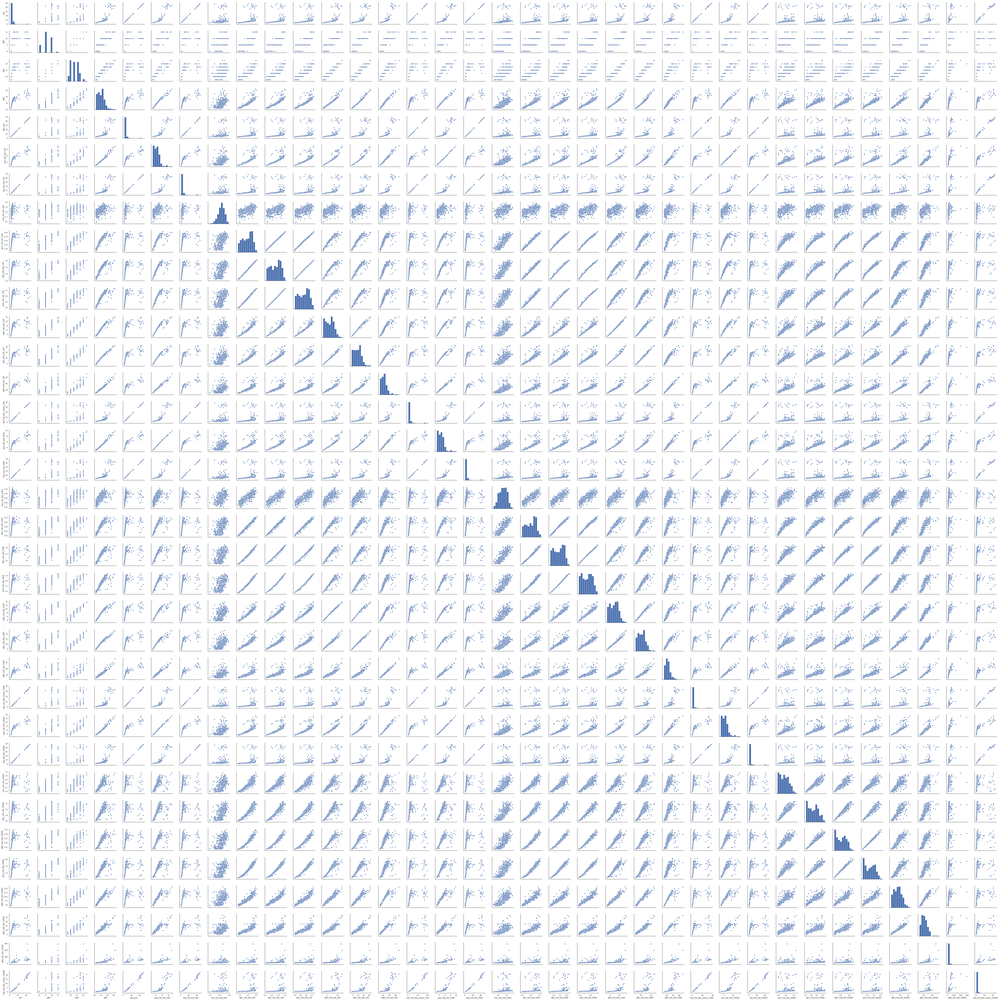

In [27]:
# Seaborn visualization library
import seaborn as sns
# Create the default pairplot
sns.pairplot(X_train)

In [28]:
print("Train shape:", X_train.shape)

Train shape: (419, 35)


In [29]:
X = X_train
Y= y_train

In [30]:
#https://www.kaggle.com/jsaguiar/baseline-with-multiple-models
from sklearn.model_selection import RandomizedSearchCV

#from sklearn.model_selection import train_test_split
#X_train, X_test, y_train, y_test = train_test_split(X,Y,test_size=.3,random_state=100, shuffle=True)
#print(X_train.shape)
#print(X_test.shape)
#print(y_train.shape)
#print(y_test.shape)

X_train= X[:219]
X_test = X[-200:]
y_train = Y[:219]
y_test = Y[-200:]

from sklearn.preprocessing import StandardScaler
scl_obj = StandardScaler()
scl_obj.fit(X_train)
X_train_scaled = scl_obj.transform(X_train)
scl_obj.fit(X_test)
X_test_scaled = scl_obj.transform(X_test)  
scl_obj.fit(X)
X_scaled = scl_obj.transform(X)

In [31]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV, KFold
import scipy.stats as st

grid = {
    'max_depth': [8, 10],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [2, 4, 12],
    'min_samples_split': [2, 6, 12],
    }
#params = grid_search_cv(RandomForestRegressor(criterion='mse', n_estimators=50),
                        #grid, X_train_scaled, target)
rfr = RandomForestRegressor(criterion='mse',n_estimators=1000)
gs1 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs1.fit(X_train_scaled, y_train.values.ravel())
gs1.best_params_    
#rf_oof = make_predictions(RandomForestRegressor(**params),
                          #X_train_scaled, target)

{'min_samples_split': 6,
 'min_samples_leaf': 2,
 'max_features': 'log2',
 'max_depth': 8}

mean_absolute_error_sqrtTime: 0.37728679170106333
r2_score_sqrtTime: 0.6669191752573062


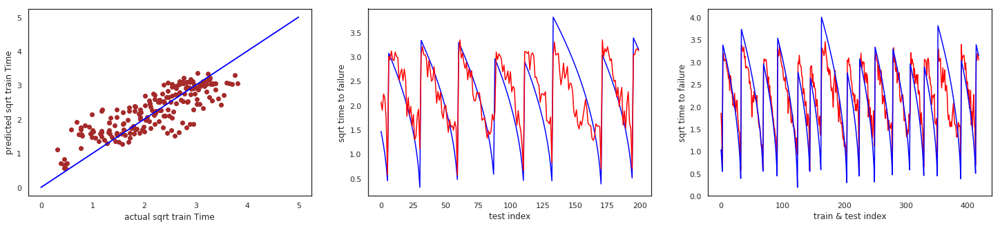

In [32]:
import matplotlib.pyplot as plt
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import r2_score

predictions =  gs1.predict(X_test_scaled)
full_predictions = gs1.predict(X_scaled)

print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')


mean_absolute_error: 1.6171492425973384
r2_score: 0.6431518738303655


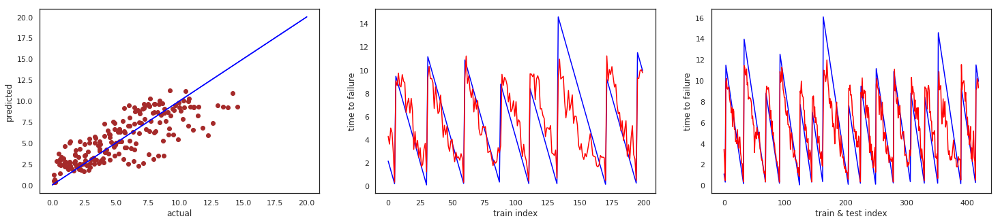

In [33]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

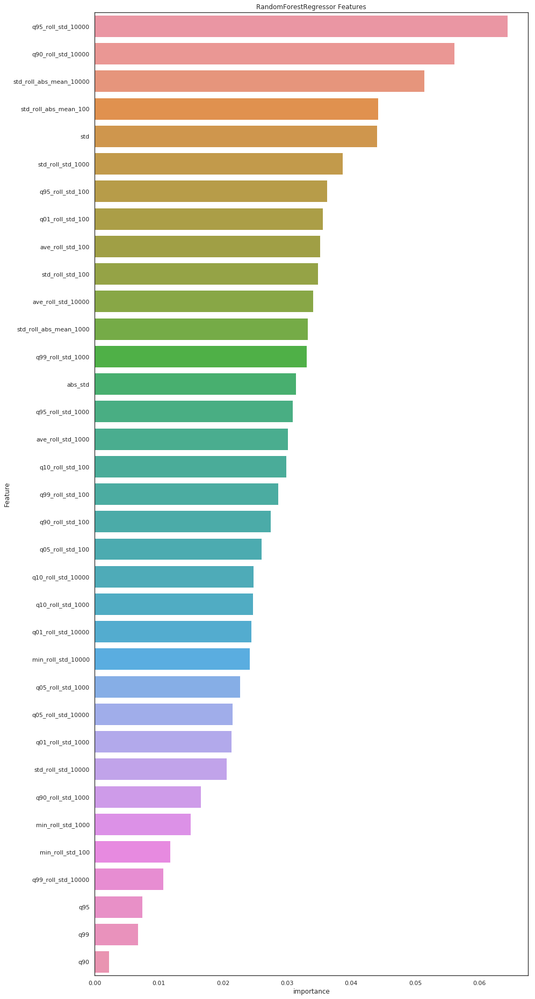

In [34]:
#The values of this array sum to 1, unless all trees are single node trees consisting of only the root node, 
#in which case it will be an array of zeros.
model = RandomForestRegressor(criterion='mse',min_samples_split=12,min_samples_leaf=2,max_features= 'log2',max_depth=8,
                              n_estimators=1000)
model.fit(X_train_scaled, y_train.values.ravel())

fold_importance_df = pd.DataFrame()
feature_importance_df = pd.DataFrame()
fold_importance_df["Feature"] = X_train.columns
fold_importance_df["importance"] = model.feature_importances_[:len(X_train.columns)]
feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
cols = (feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:200].index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]

plt.figure(figsize=(14,26))
sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance",ascending=False))
plt.title('RandomForestRegressor Features')
plt.tight_layout()
plt.savefig('RandomForestRegressor_importances.png')

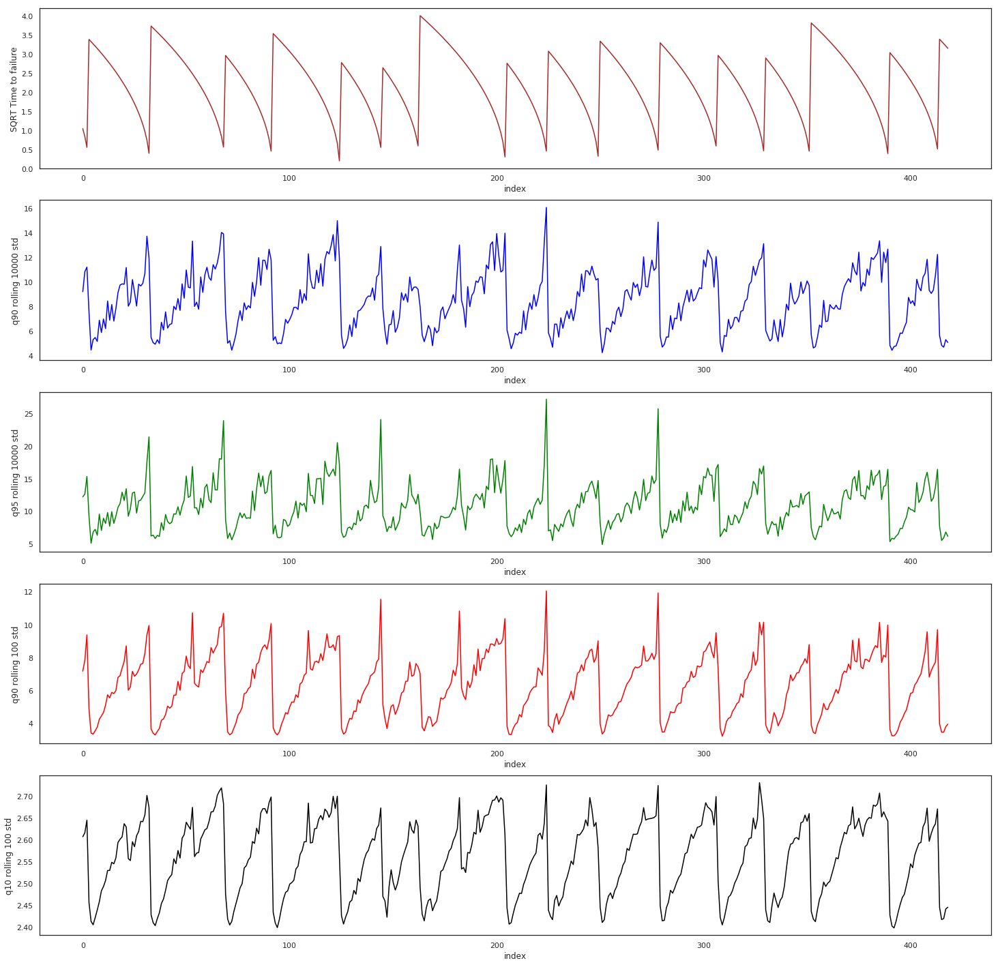

In [35]:
fig, axis = plt.subplots(5, 1, figsize=(25,25))
ax1, ax2, ax3, ax4, ax5 = axis
ax1.set_xlabel('index')
ax1.set_ylabel('SQRT Time to failure')
ax2.set_xlabel('index')
ax2.set_ylabel('q90 rolling 10000 std')
ax3.set_xlabel('index')
ax3.set_ylabel('q95 rolling 10000 std')
ax4.set_xlabel('index')
ax4.set_ylabel('q90 rolling 100 std')
ax5.set_xlabel('index')
ax5.set_ylabel('q10 rolling 100 std')
ax1.plot(Y.time_to_failure, color='brown')
ax2.plot(X.q90_roll_std_10000, color='blue')
ax3.plot(X.q95_roll_std_10000, color='green')
ax4.plot(X.q90_roll_std_100, color='red')
ax5.plot(X.q10_roll_std_100, color='black')

In [36]:
import scipy.stats as st
from xgboost.sklearn import XGBRegressor

one_to_left = st.beta(10, 1)  
from_zero_positive = st.expon(0, 50)

params = {  
    #"n_estimators": st.randint(10000, 20000),
    "max_depth": st.randint(3, 40),
    "learning_rate": st.uniform(0.01, 0.4),
    "colsample_bytree": one_to_left,
    "subsample": one_to_left,
    "gamma": st.uniform(0, 10),
    'reg_alpha': from_zero_positive,
    "min_child_weight": from_zero_positive,
}
xgbreg = XGBRegressor(nthreads=-1, n_estimators=1000)  
gs2 = RandomizedSearchCV(xgbreg, params)  
gs2.fit(X_train_scaled, y_train.values.ravel())  
gs2.best_params_

{'colsample_bytree': 0.8765018979720607,
 'gamma': 3.15380753842204,
 'learning_rate': 0.15785314342646714,
 'max_depth': 14,
 'min_child_weight': 18.7733473761021,
 'reg_alpha': 9.155606175437015,
 'subsample': 0.9318064709654196}

mean_absolute_error_sqrtTime: 0.415202991515398
r2_score_sqrtTime: 0.5946313180998712


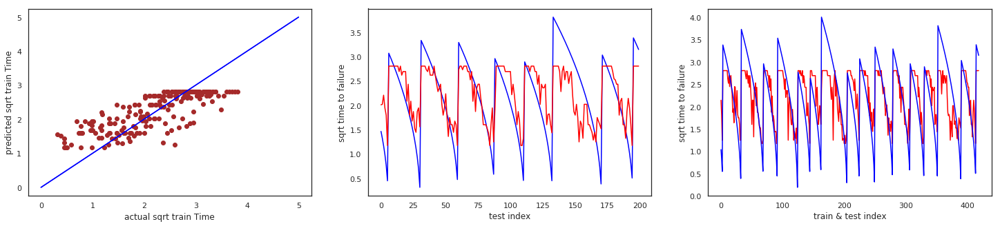

In [37]:
predictions =  gs2.predict(X_test_scaled)
full_predictions = gs2.predict(X_scaled)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.7465509806334147
r2_score: 0.5796630227207586


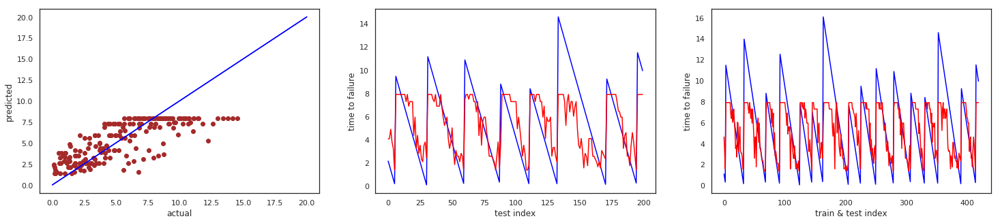

In [38]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('test index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [39]:
from sklearn.tree import DecisionTreeRegressor

grid = {
    'max_depth': [4, 6, 8, 10, 12],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [2, 4, 12],
    'min_samples_split': st.randint(10,100),
}
#params = grid_search_cv(DecisionTreeRegressor(criterion='mae'),
                        #grid, X_train_scaled, target)
#rf_oof = make_predictions(DecisionTreeRegressor(splitter='random', **params),
                         # X_train_scaled, target)
rfr = DecisionTreeRegressor(criterion='mae')
gs3 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs3.fit(X_train_scaled, y_train.values.ravel())  
gs3.best_params_      

{'max_depth': 6,
 'max_features': 'log2',
 'min_samples_leaf': 4,
 'min_samples_split': 71}

mean_absolute_error_sqrtTime: 0.44414756789803506
r2_score_sqrtTime: 0.5439446298696601


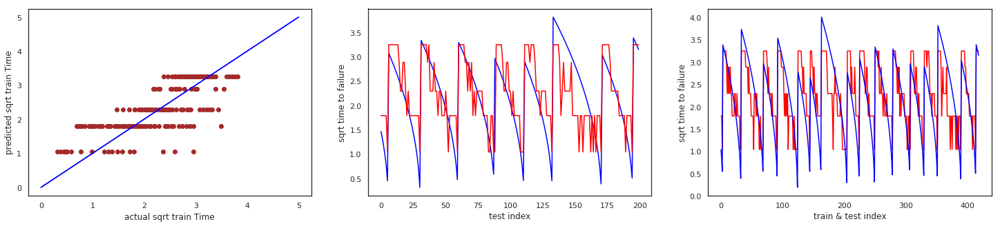

In [40]:
predictions =  gs3.predict(X_test_scaled)
full_predictions = gs3.predict(X_scaled)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.875338304846752
r2_score: 0.5168284779293961


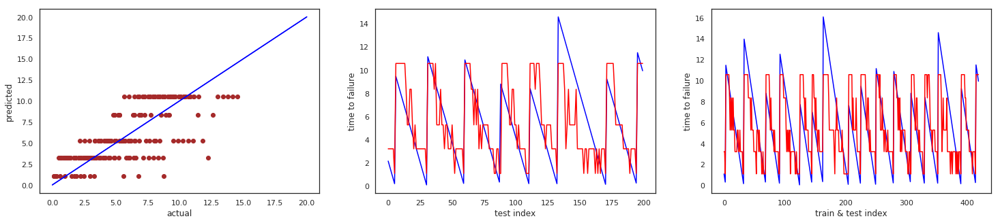

In [41]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('test index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [42]:
from sklearn.ensemble import AdaBoostRegressor
from sklearn.linear_model import LinearRegression, Ridge

grid = {
    #'max_depth': [4, 6, 8, 10, 12],
    #'max_features': ['auto', 'sqrt', 'log2'],
    #'min_samples_leaf': [2, 4, 12],
    #'min_samples_split': [4,8,12,16,20, 30, 40, 50, 60],
    "learning_rate": st.uniform(0.01, 0.4),
    'loss' : ["square"],
    #'n_estimators' : st.randint(10000, 20000)
}
#params = grid_search_cv(AdaBoostRegressor(),
                        #grid, X_train_scaled, target)
#rf_oof = make_predictions(AdaBoostRegressor(**params),
                          #X_train_scaled, target)
base = Ridge(alpha=1) 
rfr = AdaBoostRegressor(n_estimators = 500, base_estimator=base)
gs4 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs4.fit(X_train_scaled, y_train.values.ravel())  
gs4.best_params_      

{'learning_rate': 0.018261985736355728, 'loss': 'square'}

mean_absolute_error_sqrtTime: 0.399427600330821
r2_score_sqrtTime: 0.622592268768577


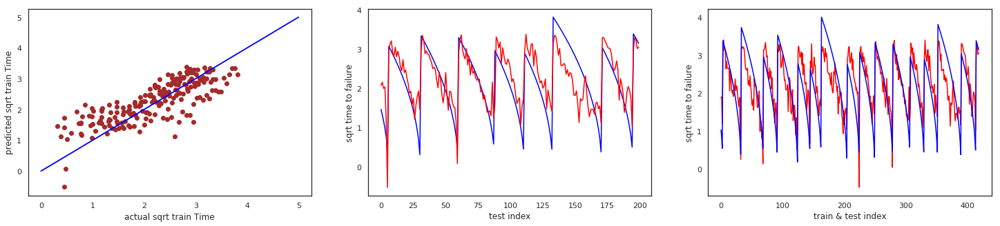

In [43]:
predictions =  gs4.predict(X_test_scaled)
full_predictions = gs4.predict(X_scaled)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.666159055020213
r2_score: 0.6242603665453971


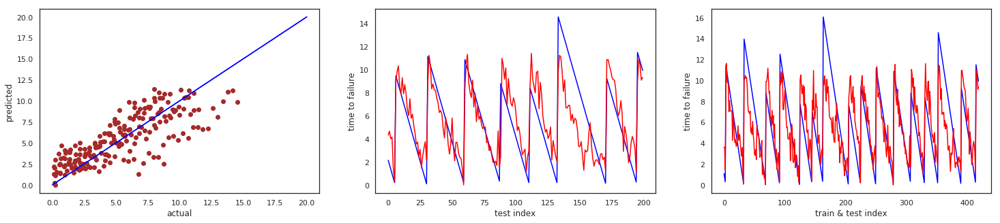

In [44]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('test index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

mean_absolute_error: 1.666159055020213
r2_score: 0.6242603665453971


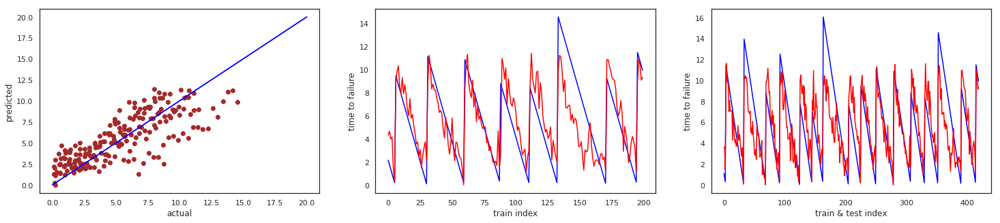

In [45]:
predictions[predictions>3.5]=3.5
y_predict = np.square(predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

The size of data is increasing day by day and it is becoming difficult for traditional data science algorithms to give faster results. Light GBM is prefixed as ‘Light’ because of its high speed. Light GBM can handle the large size of data and takes lower memory to run. Another reason of why Light GBM is popular is because it focuses on accuracy of results. LGBM also supports GPU learning and thus data scientists are widely using LGBM for data science application development. [https://medium.com/@pushkarmandot/https-medium-com-pushkarmandot-what-is-lightgbm-how-to-implement-it-how-to-fine-tune-the-parameters-60347819b7fc]

In [46]:
import lightgbm as lgb

grid = {
    'learning_rate': [0.1, 0.05, 0.01, 0.005],
    'num_leaves': list(range(8, 92, 4)),
    'max_depth': [3, 4, 5, 6, 8, 12, 16, -1],
    'feature_fraction': [0.8, 0.85, 0.9, 0.95, 1],
    'subsample': [0.8, 0.85, 0.9, 0.95, 1],
    'lambda_l1': [0, 0.1, 0.2, 0.4, 0.6, 0.9],
    'lambda_l2': [0, 0.1, 0.2, 0.4, 0.6, 0.9],
    'min_data_in_leaf': [10, 20, 40, 60, 100],
    'min_gain_to_split': [0, 0.001, 0.01, 0.1],
    'random_seed': st.randint(10, 100),
    }
#params = grid_search_cv(RandomForestRegressor(criterion='mse', n_estimators=50),
                        #grid, X_train_scaled, target)
rfr = lgb.LGBMRegressor(n_estimators=10000)
gs5 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs5.fit(X_train_scaled, y_train.values.ravel())  
gs5.best_params_    
#rf_oof = make_predictions(RandomForestRegressor(**params),
                          #X_train_scaled, target)

{'feature_fraction': 0.8,
 'lambda_l1': 0.1,
 'lambda_l2': 0.4,
 'learning_rate': 0.01,
 'max_depth': 4,
 'min_data_in_leaf': 20,
 'min_gain_to_split': 0.1,
 'num_leaves': 16,
 'random_seed': 48,
 'subsample': 1}

mean_absolute_error_sqrtTime: 0.4027206837151215
r2_score_sqrtTime: 0.6167283130811214


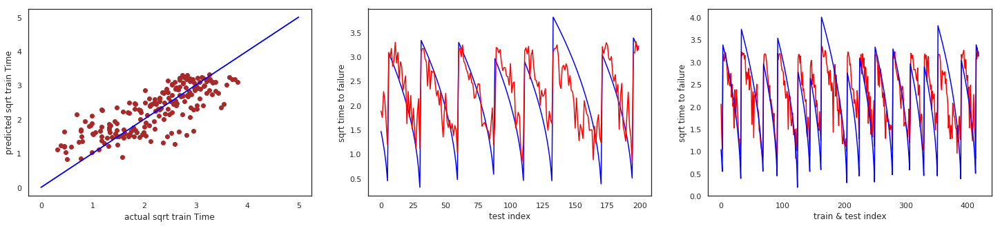

In [47]:
predictions =  gs5.predict(X_test_scaled)
full_predictions = gs5.predict(X_scaled)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.6956282042159183
r2_score: 0.6123200882099006


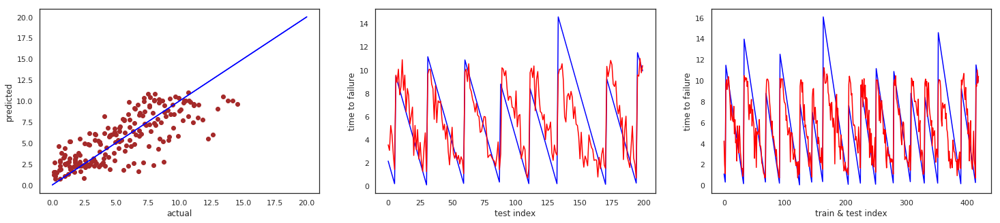

In [48]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('test index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [49]:
from sklearn import ensemble
from sklearn.ensemble import ExtraTreesRegressor

grid = {
    'max_depth': [6,11,15,20, 25, 30, 35, 40],
    'max_features': ['auto'],
    'min_samples_leaf': [10,16,20,40],
    'min_samples_split': [20,30,40,50,100,150,200],
    'n_estimators': [100, 200, 300, 400, 500,600, 700, 800, 900,1000],
    'min_weight_fraction_leaf':  st.uniform(0, 0.5)
    }

etr = ExtraTreesRegressor(criterion='mae')
gs6 = RandomizedSearchCV(etr, param_distributions = grid)  
gs6.fit(X_train_scaled, y_train.values.ravel())  
gs6.best_params_ 

{'max_depth': 25,
 'max_features': 'auto',
 'min_samples_leaf': 16,
 'min_samples_split': 50,
 'min_weight_fraction_leaf': 0.17198238320317694,
 'n_estimators': 100}

mean_absolute_error_sqrtTime: 0.3865861345946789
r2_score_sqrtTime: 0.6453479991715694


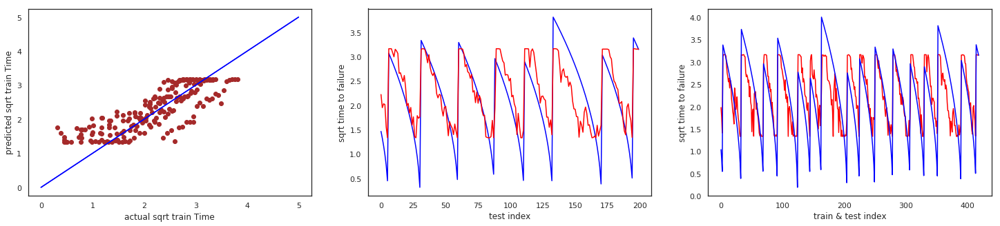

In [50]:
predictions =  gs6.predict(X_test_scaled)
train_predictions = gs6.predict(X_train_scaled)
full_predictions = gs6.predict(X_scaled)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('test index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

train mean_absolute_error: 2.103981455482157
mean_absolute_error: 1.6131666773176787
train r2_score: 0.5540644095357096
test r2_score: 0.651533737859563


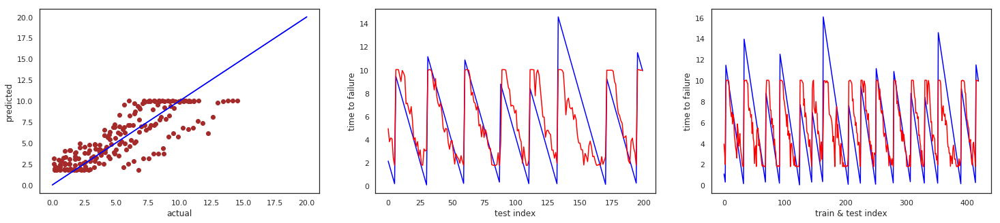

In [51]:
y_predict = np.square(predictions)
y_train_predict = np.square(train_predictions)
y_test_nolog = np.square(y_test)
y_train_nolog = np.square(y_train)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('train mean_absolute_error:', mean_absolute_error(y_train_nolog, y_train_predict))
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('train r2_score:', r2_score(y_train_nolog, y_train_predict))
print('test r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('test index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

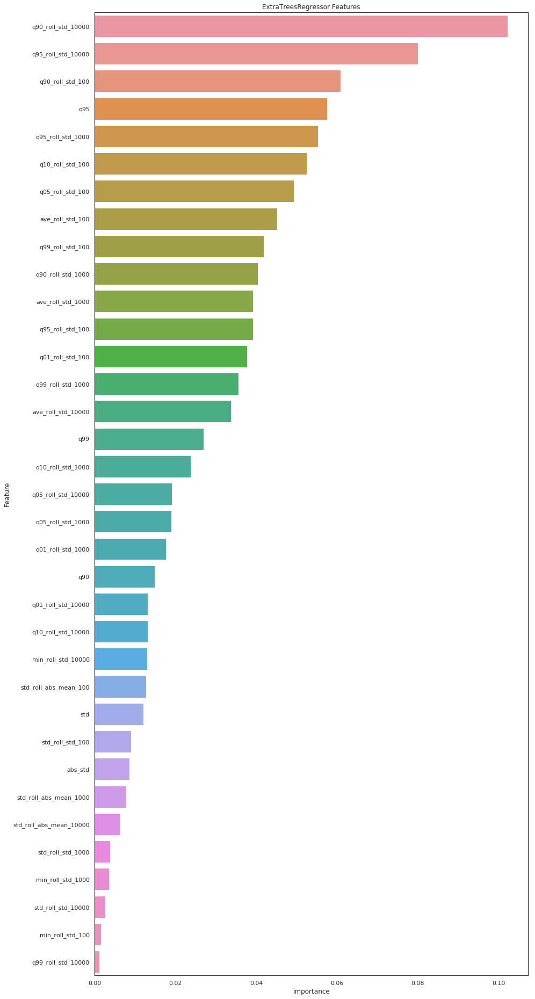

In [52]:
#The values of this array sum to 1, unless all trees are single node trees consisting of only the root node, 
#in which case it will be an array of zeros.
model = ExtraTreesRegressor(criterion='mse',max_depth=25,max_features='auto',min_samples_leaf=16,min_samples_split=30,
                            min_weight_fraction_leaf= 0.06225661421078982,n_estimators=400 )
model.fit(X_train_scaled, y_train.values.ravel())

fold_importance_df = pd.DataFrame()
feature_importance_df = pd.DataFrame()
fold_importance_df["Feature"] = X_train.columns
fold_importance_df["importance"] = model.feature_importances_[:len(X_train.columns)]
feature_importance_df = pd.concat([feature_importance_df, fold_importance_df], axis=0)
cols = (feature_importance_df[["Feature", "importance"]]
        .groupby("Feature")
        .mean()
        .sort_values(by="importance", ascending=False)[:200].index)
best_features = feature_importance_df.loc[feature_importance_df.Feature.isin(cols)]

plt.figure(figsize=(14,26))
sns.barplot(x="importance", y="Feature", data=best_features.sort_values(by="importance",ascending=False))
plt.title('ExtraTreesRegressor Features')
plt.tight_layout()
plt.savefig('ExtraTreesRegressor_importances.png')

### PCA

In [53]:
from sklearn.decomposition import PCA

pca = PCA(n_components=5)
principalComponents = pca.fit_transform(X)
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2', 'principal component 3', 'principal component 4', 'principal component 5'])
principalDf.head()

,principal component 1,principal component 2,principal component 3,principal component 4,principal component 5
0,-2.46669330,-1.50421585,-6.18849412,-0.63188922,-0.28365163
1,11.89322430,5.79990594,-7.15603333,-1.37063382,0.55847801
2,96.51216752,-40.54679546,23.94597691,-1.47075921,-0.34921721
3,-10.63854675,3.27736149,3.79690779,2.50623018,-0.41676317
4,-23.59003840,3.32329044,12.71717992,-0.18761911,0.50318325


In [54]:
pca.explained_variance_ratio_

array([8.09199903e-01, 1.16031807e-01, 7.07245985e-02, 2.40935499e-03,
       6.09029218e-04])

In [55]:
X_PCA_train_final = principalDf.values

In [56]:
#from sklearn.model_selection import train_test_split
#X_PCA_train, X_PCA_test, y_train, y_test = train_test_split(X_PCA_train_final,Y,test_size=.3,random_state=100, shuffle=True)
X_PCA_train= X_PCA_train_final[:219]
X_PCA_test = X_PCA_train_final[-200:]
y_train = Y[:219]
y_test = Y[-200:]


print(X_train.shape)
print(X_test.shape)
print(y_train.shape)
print(y_test.shape)
    
scl_obj.fit(X_PCA_train)
X_PCA_train = scl_obj.transform(X_PCA_train)
scl_obj.fit(X_PCA_test)
X_PCA_test = scl_obj.transform(X_PCA_test)
scl_obj.fit(X_PCA_train_final)
X_PCA = scl_obj.transform(X_PCA_train_final)

(219, 35)
(200, 35)
(219, 1)
(200, 1)


In [57]:
grid = {
    'max_depth': [8, 10],
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': [2, 4, 12],
    'min_samples_split': [2, 6, 12],
    #'n_estimators' : st.randint(10000, 20000),
}
#params = grid_search_cv(RandomForestRegressor(criterion='mse', n_estimators=50),
                        #grid, X_train_scaled, target)
rfr = RandomForestRegressor(criterion='mse',n_estimators=1000)
gs7 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs7.fit(X_PCA_train, y_train.values.ravel())  
gs7.best_params_   
#rf_oof = make_predictions(RandomForestRegressor(**params),
                          #X_train_scaled, target)

{'min_samples_split': 6,
 'min_samples_leaf': 12,
 'max_features': 'auto',
 'max_depth': 10}

mean_absolute_error_sqrtTime: 0.4027420397680976
r2_score_sqrtTime: 0.6132867979019628


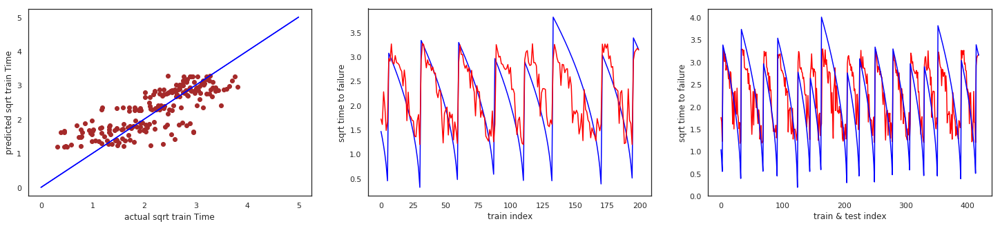

In [58]:
predictions =  gs7.predict(X_PCA_test)
full_predictions = gs7.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.6767695508469
r2_score: 0.6144029437257865


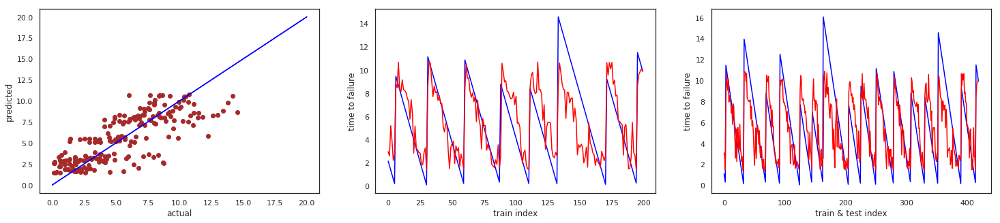

In [59]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [60]:
import scipy.stats as st
from xgboost.sklearn import XGBRegressor

one_to_left = st.beta(10, 1)  
from_zero_positive = st.expon(0, 50)

params = {  
    #"n_estimators": st.randint(10000, 20000),
    "max_depth": st.randint(3, 40),
    "learning_rate": st.uniform(0.01, 0.4),
    "colsample_bytree": one_to_left,
    "subsample": one_to_left,
    "gamma": st.uniform(0, 10),
    'reg_alpha': from_zero_positive,
    "min_child_weight": from_zero_positive,
}

xgbreg = XGBRegressor(nthreads=-1,n_estimators=500, cv=5)  
gs8 = RandomizedSearchCV(xgbreg, params)  
gs8.fit(X_PCA_train, y_train.values.ravel())  
gs8.best_params_

{'colsample_bytree': 0.927894178404516,
 'gamma': 0.9729274218669226,
 'learning_rate': 0.3348108126315055,
 'max_depth': 6,
 'min_child_weight': 35.393799466908945,
 'reg_alpha': 19.828489045554516,
 'subsample': 0.9755663784414681}

mean_absolute_error_sqrtTime: 0.43663615837693215
r2_score_sqrtTime: 0.5449570749972461


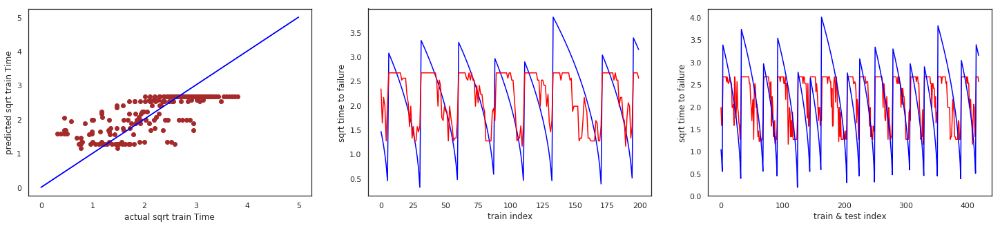

In [61]:
predictions =  gs8.predict(X_PCA_test)
full_predictions = gs8.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.8449111928113409
r2_score: 0.5226827702970134


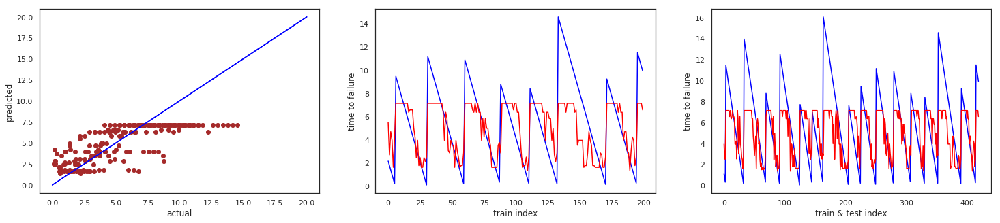

In [62]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [63]:
from sklearn.tree import DecisionTreeRegressor

grid = {
    'max_depth': st.randint(4,12),
    'max_features': ['auto', 'sqrt', 'log2'],
    'min_samples_leaf': st.randint(2,12),
    'min_samples_split': st.randint(10,100),
}
#params = grid_search_cv(DecisionTreeRegressor(criterion='mae'),
                        #grid, X_train_scaled, target)
#rf_oof = make_predictions(DecisionTreeRegressor(splitter='random', **params),
                         # X_train_scaled, target)
    
rfr = DecisionTreeRegressor(criterion='mae')
gs9 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs9.fit(X_PCA_train, y_train.values.ravel())  
gs9.best_params_ 

{'max_depth': 8,
 'max_features': 'auto',
 'min_samples_leaf': 2,
 'min_samples_split': 64}

mean_absolute_error_sqrtTime: 0.4239929273724556
r2_score_sqrtTime: 0.5643181506751331


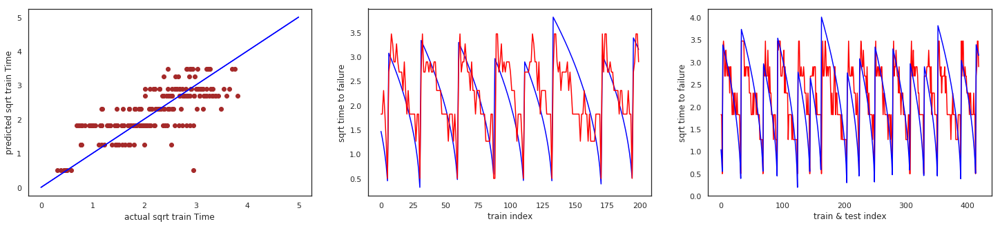

In [64]:
predictions =  gs9.predict(X_PCA_test)
full_predictions = gs9.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.875233633664544
r2_score: 0.5082142235735256


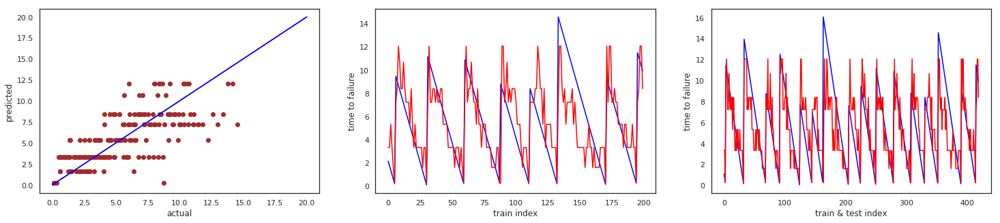

In [65]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [66]:
from sklearn.ensemble import AdaBoostRegressor

grid = {
    #'max_depth': [4, 6, 8, 10, 12],
    #'max_features': ['auto', 'sqrt', 'log2'],
    #'min_samples_leaf': [2, 4, 12],
    #'min_samples_split': [4,8,12,16,20, 30, 40, 50, 60],
    "learning_rate": st.uniform(0.01, 0.4),
    'loss' : ["square"],
    #'n_estimators' : st.randint(10000, 20000)
}
#params = grid_search_cv(AdaBoostRegressor(),
                        #grid, X_train_scaled, target)
#rf_oof = make_predictions(AdaBoostRegressor(**params),
                          #X_train_scaled, target)
base = Ridge(alpha=1) 
rfr = AdaBoostRegressor(n_estimators = 500, base_estimator=base)
gs10 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs10.fit(X_PCA_train, y_train.values.ravel())  
gs10.best_params_ 

{'learning_rate': 0.3539031894510675, 'loss': 'square'}

mean_absolute_error_sqrtTime: 0.43225908995016193
r2_score_sqrtTime: 0.5386741389733025


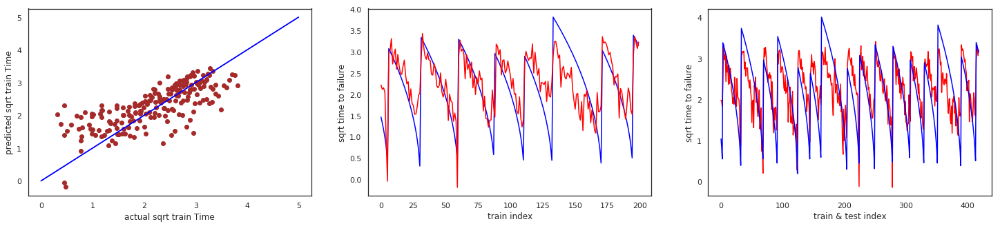

In [67]:
predictions =  gs10.predict(X_PCA_test)
full_predictions = gs10.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.7865973401720177
r2_score: 0.5659522918447465


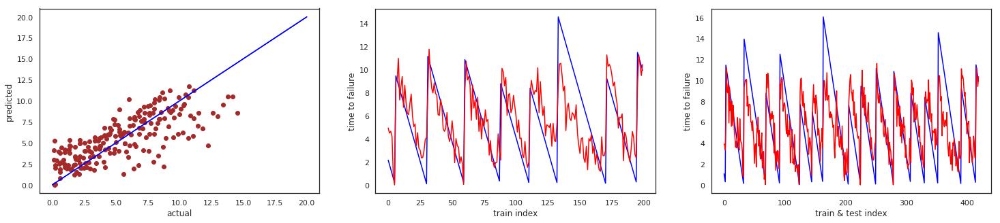

In [68]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [69]:
import lightgbm as lgb
import scipy.stats as st

grid = {
     'learning_rate': [0.1, 0.05, 0.01, 0.005],
    'num_leaves': list(range(8, 92, 4)),
    'max_depth': [3, 4, 5, 6, 8, 12, 16, -1],
    'feature_fraction': [0.8, 0.85, 0.9, 0.95, 1],
    'subsample': [0.8, 0.85, 0.9, 0.95, 1],
    'lambda_l1': [0, 0.1, 0.2, 0.4, 0.6, 0.9],
    'lambda_l2': [0, 0.1, 0.2, 0.4, 0.6, 0.9],
    'min_data_in_leaf': [10, 20, 40, 60, 100],
    'min_gain_to_split': [0, 0.001, 0.01, 0.1],
    'random_seed': st.randint(10, 100),
    }
#params = grid_search_cv(RandomForestRegressor(criterion='mse', n_estimators=50),
                        #grid, X_train_scaled, target)
rfr = lgb.LGBMRegressor(n_estimators=10000)
gs11 = RandomizedSearchCV(rfr, param_distributions = grid)  
gs11.fit(X_PCA_train, y_train.values.ravel())  
gs11.best_params_    
#rf_oof = make_predictions(RandomForestRegressor(**params),
                          #X_train_scaled, target)

{'feature_fraction': 1,
 'lambda_l1': 0.1,
 'lambda_l2': 0.6,
 'learning_rate': 0.05,
 'max_depth': -1,
 'min_data_in_leaf': 60,
 'min_gain_to_split': 0.1,
 'num_leaves': 64,
 'random_seed': 76,
 'subsample': 0.95}

mean_absolute_error_sqrtTime: 0.40614679881850235
r2_score_sqrtTime: 0.6016112327114109


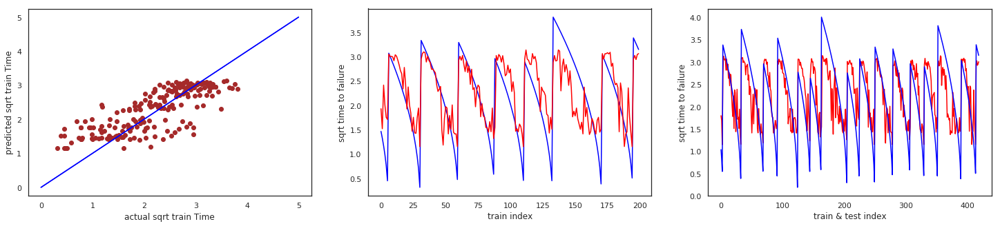

In [70]:
predictions =  gs11.predict(X_PCA_test)
full_predictions = gs11.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.6906270517432374
r2_score: 0.6050104634756173


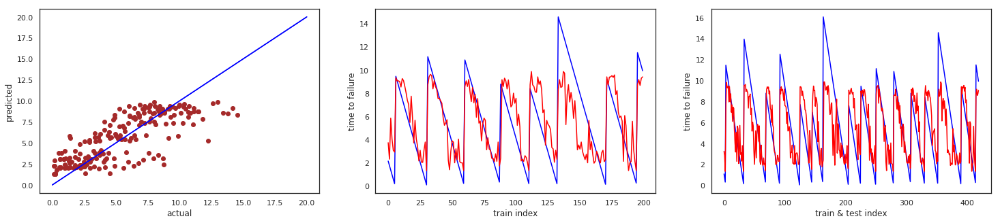

In [71]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')

In [72]:
from sklearn import ensemble
from sklearn.ensemble import ExtraTreesRegressor

grid = {
    'max_depth': [6,11,15,20],
    'max_features': ['auto'],
    'min_samples_leaf': [10,16,20,40],
    'min_samples_split': [50,98,150,200],
    'n_estimators': [100, 200, 495,1000],
    'min_weight_fraction_leaf':  st.uniform(0, 0.5)
    }

etr = ExtraTreesRegressor(criterion='mae')
gs12 = RandomizedSearchCV(etr, param_distributions = grid)  
gs12.fit(X_PCA_train, y_train.values.ravel())  
gs12.best_params_ 

{'max_depth': 11,
 'max_features': 'auto',
 'min_samples_leaf': 16,
 'min_samples_split': 50,
 'min_weight_fraction_leaf': 0.055517797734908725,
 'n_estimators': 495}

mean_absolute_error_sqrtTime: 0.47922265161920075
r2_score_sqrtTime: 0.3893554102272381


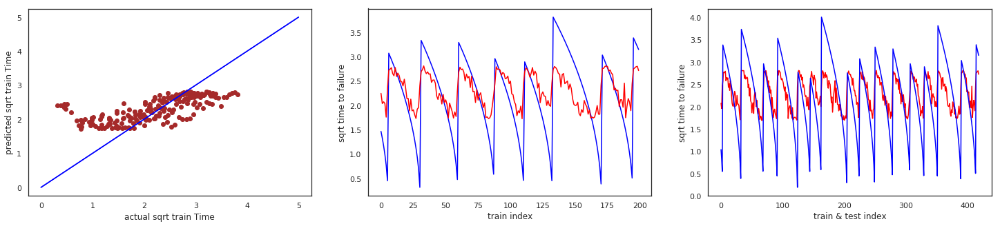

In [73]:
predictions =  gs12.predict(X_PCA_test)
full_predictions = gs12.predict(X_PCA)
print('mean_absolute_error_sqrtTime:', mean_absolute_error(y_test, predictions))
print('r2_score_sqrtTime:', r2_score(y_test, predictions))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual sqrt train Time')
ax1.set_ylabel('predicted sqrt train Time')
ax2.set_xlabel('train index')
ax2.set_ylabel('sqrt time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('sqrt time to failure')
ax1.scatter(y_test.values, predictions, color='brown')
ax1.plot([(0, 0), (5, 5)], [(0, 0), (5, 5)], color='blue')
ax2.plot(y_test.values, color='blue')
ax2.plot(predictions, color='red')
ax3.plot(full_predictions, color='red')
ax3.plot(Y, color='blue')

mean_absolute_error: 1.9744177598072918
r2_score: 0.4675279763326856


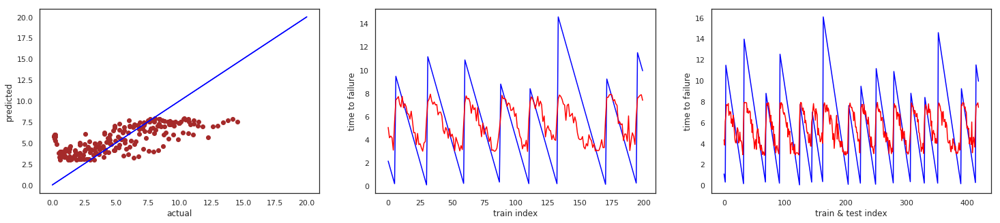

In [74]:
y_predict = np.square(predictions)
y_test_nolog = np.square(y_test)
y_nolog = np.square(Y)
y_nolog_predict = np.square(full_predictions)
print('mean_absolute_error:', mean_absolute_error(y_test_nolog, y_predict))
print('r2_score:', r2_score(y_test_nolog, y_predict))

fig, axis = plt.subplots(1, 3, figsize=(25,5))
ax1, ax2, ax3 = axis
ax1.set_xlabel('actual')
ax1.set_ylabel('predicted')
ax2.set_xlabel('train index')
ax2.set_ylabel('time to failure')
ax3.set_xlabel('train & test index')
ax3.set_ylabel('time to failure')
ax1.scatter(y_test_nolog.values, y_predict, color='brown')
ax1.plot([(0, 0), (20, 20)], [(0, 0), (20, 20)], color='blue')
ax2.plot(y_test_nolog.values, color='blue')
ax2.plot(y_predict, color='red')
ax3.plot(y_nolog, color='blue')
ax3.plot(y_nolog_predict, color='red')